In [91]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
import scipy.ndimage as scimg
from scipy.ndimage import gaussian_filter as gf
from scipy.stats import binned_statistic
from photutils import DAOStarFinder, aperture_photometry, CircularAperture
from astropy.stats import mad_std
from astropy.modeling.functional_models import Gaussian1D
import os


# I think I like this best for interactive figures, frankly
#%matplotlib qt 
from astropy.modeling import models, fitting
import warnings

In [92]:
def Imshow(image, figsize=(16,12), **kwargs):
    plt.figure(figsize = figsize)
    plt.imshow(image, origin='lower', interpolation='none', **kwargs, aspect='auto')
    plt.colorbar(shrink=0.8)

In [93]:
def psd2d(image):
    fft = np.fft.fft2(image)
    p2d = np.power(np.abs(fft), 2)
    return p2d

In [94]:
def FindSources(image, threshold_sigma = 3.5, fwhm = 4.7):
    bkg_sigma = mad_std(image) # The background variance of the image
    daofind = DAOStarFinder(fwhm = fwhm, 
                            threshold = threshold_sigma*bkg_sigma, 
                            exclude_border = True)
    sources = daofind(image) 
    positions = [(x,y) for x,y in zip(sources['xcentroid'].data, sources['ycentroid'].data)]
    apertures = CircularAperture(positions, r=fwhm)
    
    return sources, apertures

In [95]:
def BinCenter(bin_edges):
    return (bin_edges[1:] + bin_edges[0:-1])/2.

In [96]:
# You'll need to change this to point to 
path = 'C:/Users/16472/Desktop/fft_pmc_filtering/'
os.chdir(path)

In [97]:
hdu = fits.open('2020-01-07--04-14-24--151.fits')
header = hdu[0].header.copy()
image_raw = np.array(hdu[0].data.copy(), dtype='float64')
hdu.close()

Let's take a look at the raw image.

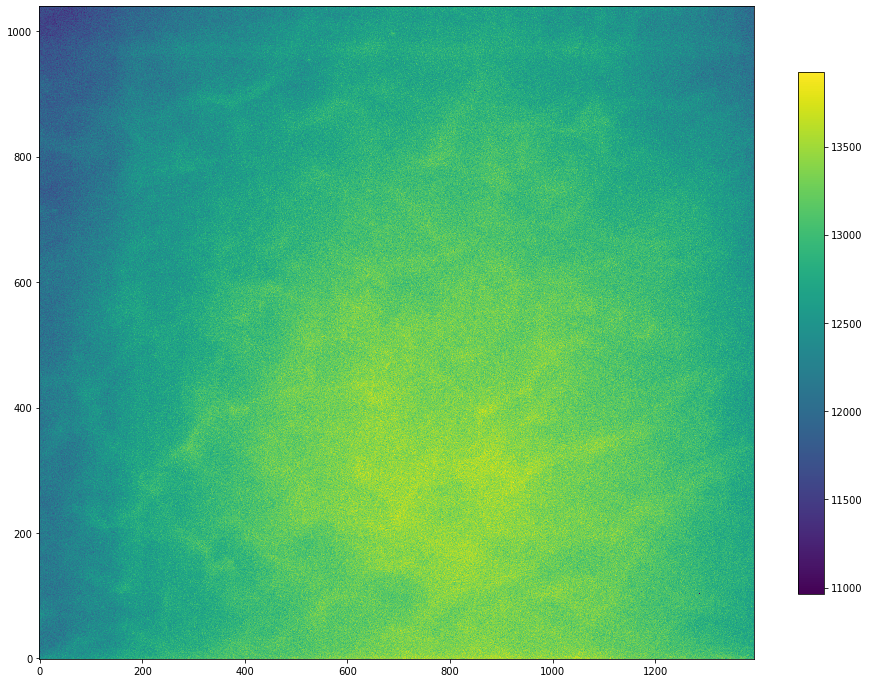

In [98]:
Imshow(image_raw)

A good place to start in understanding the image is to look at the histogram.  Notice that the distribution is really broad, and there are few pixels that are really low compared to the average.

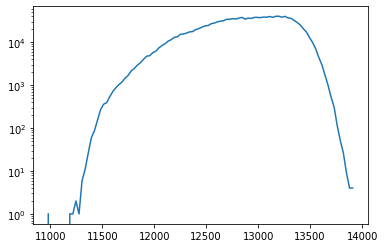

In [99]:
h_image_raw, be_image_raw = np.histogram(image_raw, bins=100)
plt.semilogy(BinCenter(be_image_raw), h_image_raw)

In [100]:
%%time
""" It's a huge help to sort of "flatten" the image by removing low order polynomials, 
at least as far as finding "hot pixels".  I'm not actually sure why this is such 
a slow process; it could probably be speeded up by a direct coding of the linear fit. 
That's the reason for the try/except: if you've already run the notebook and done this 
calculation, just save it.

"""

# dimensions and a grid for fitting
ny, nx = image_raw.shape
x, y = np.mgrid[:ny, :nx]

# Fit the data using astropy.modeling
p_init = models.Polynomial2D(degree=3)
fit_p = fitting.LevMarLSQFitter()

with warnings.catch_warnings():
    # Ignore model linearity warning from the fitter
    warnings.simplefilter('ignore')
    p = fit_p(p_init, x, y, image_raw)

image_flatten = image_raw-p(x,y)

Wall time: 1min 10s


Notice that the image now has zero mean, and also goes to zero at the edges.  (This latter will be helpful when we go to Fourier transform ... it accomplishes a lot of what a "window" would do.)  We can be pretty confident that we're not missing any stars in the thing we subtracted, since it varies on such large scales.

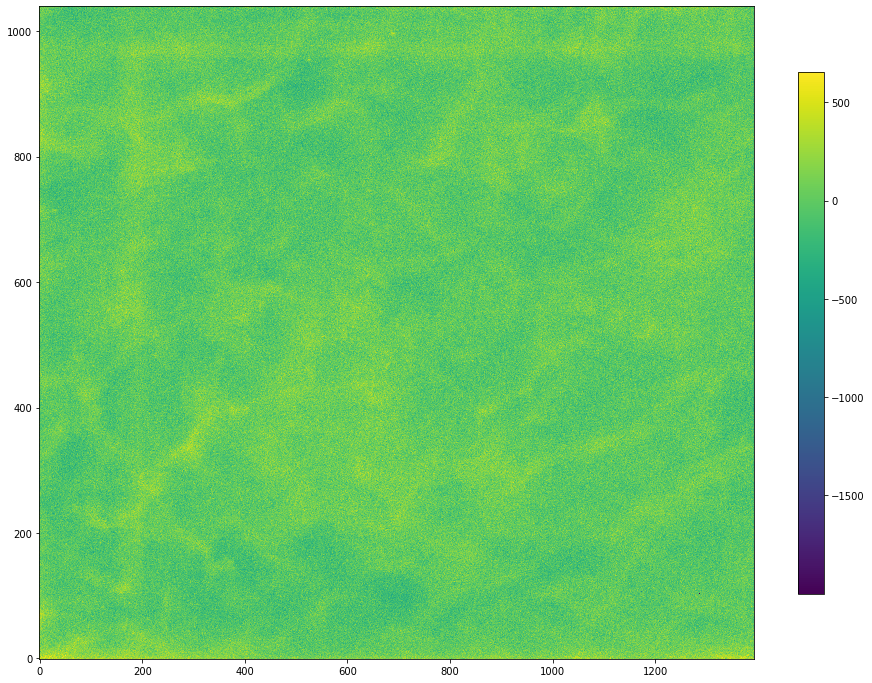

In [101]:
%matplotlib inline
Imshow(image_flatten)

Now the anomalously low pixels jump out at us, and it becomes clearer that the remaining distribution is ... pretty Gaussian, actually.

In [102]:
var_image_fl = mad_std(image_flatten)
threshold = 6*var_image_fl # the sigma here is a bit cherry-picked ...

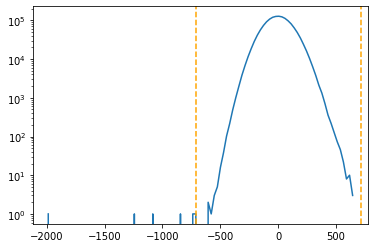

In [103]:
h_image_fl, be_image_fl = np.histogram(image_flatten, bins=100)
plt.semilogy(BinCenter(be_image_fl), h_image_fl)
plt.axvline(-threshold,color='orange',linestyle='--')
plt.axvline(+threshold,color='orange',linestyle='--')

In [104]:
wh_outliers = np.argwhere(np.logical_or(image_flatten < -threshold, image_flatten > threshold))

In [105]:
image_flatten_no_outliers = image_flatten.copy()
# Let's get rid of these discrepant pixels
for outlier in wh_outliers:
    med = np.median(image_flatten[outlier[0]-1:outlier[0]+2, outlier[1]-1:outlier[1]+2])
    image_flatten_no_outliers[outlier[0], outlier[1]] = med
    print(image_flatten[outlier[0], outlier[1]], med)
#image_flatten_no_outliers[wh_outer]

-1999.6453427587512 -35.97844202074339
-743.7839211708306 -88.3896207877533
-1233.4711895152104 44.34380093171785
-839.7882216953512 -9.29574803050491
-720.0504553544051 -10.77834264937701
-1096.692814943397 95.19483196063993


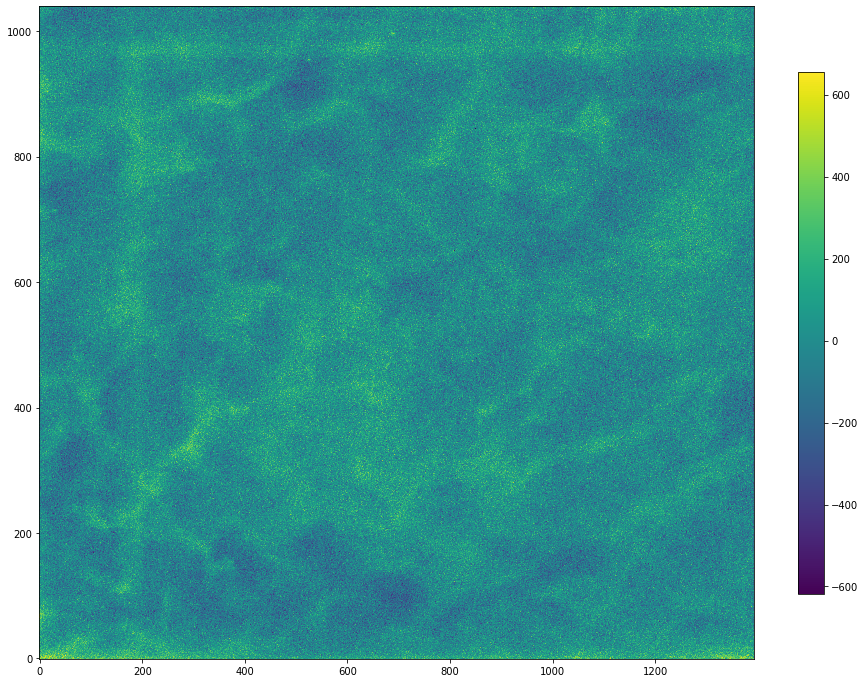

In [106]:
Imshow(image_flatten_no_outliers)

In [107]:
h_image_flno, be_image_flno = np.histogram(image_flatten_no_outliers, bins=100)
gaussian1d = Gaussian1D()
dist_image = gaussian1d.evaluate(BinCenter(be_image_flno), amplitude=h_image_flno.max(), 
                               mean=0, stddev=np.std(image_flatten_no_outliers))

That slight excess on the right is where we'll look for sources.  But it's also where the remaining clouds live ... so we're not done yet.

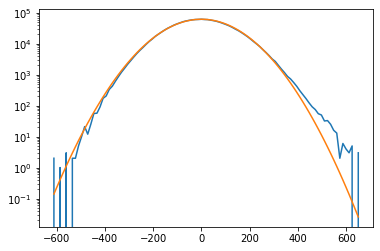

In [108]:
plt.semilogy(BinCenter(be_image_flno), h_image_flno)
plt.plot(BinCenter(be_image_flno), dist_image)

Having gotten rid of the big large-scale features and the outliers, let's look at what's left.

In [109]:
hdu = fits.PrimaryHDU(image_flatten_no_outliers-np.mean(image_flatten_no_outliers))
hdu.writeto('starcam_preproc.fits', overwrite=True)

In [110]:
# Generally speaking, the mean is not a useful quantity
image = image_flatten_no_outliers
image -= np.mean(image)

The simplest thing that seems to work reasonably well is to low-pass filter with a Gaussian filter, subtract that from the image, and then gaussian filter again.  If the image is $I$ and a Gaussian filter with width $\sigma$ is denoted $G_\sigma[I]$, then this can be written
\begin{equation}
\tilde{I} = G_{\sigma_1}[I] - G_{\sigma_2}[I]
\end{equation}
where $\sigma_2 > \sigma_1$.

A choice that works OK is shown below.

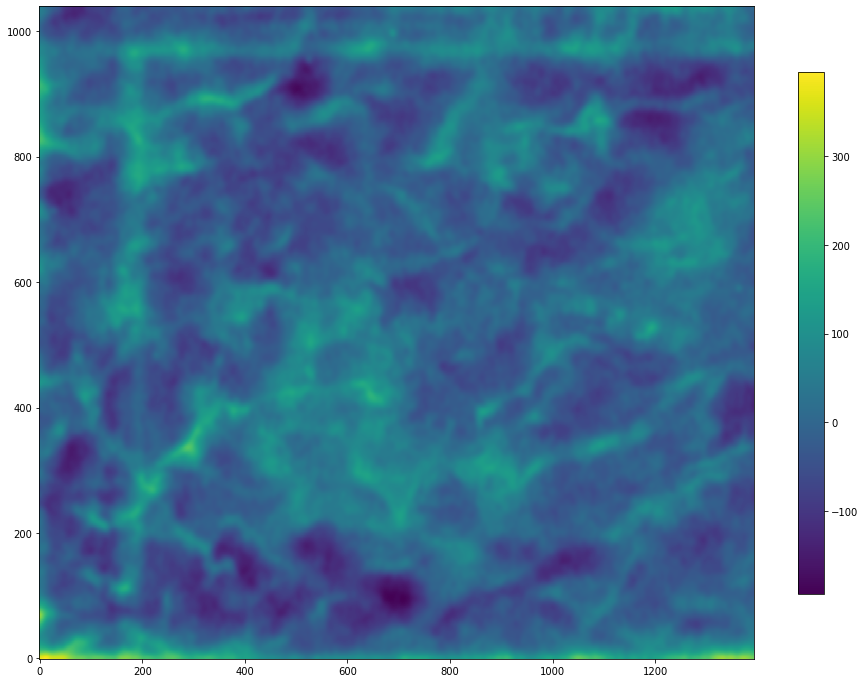

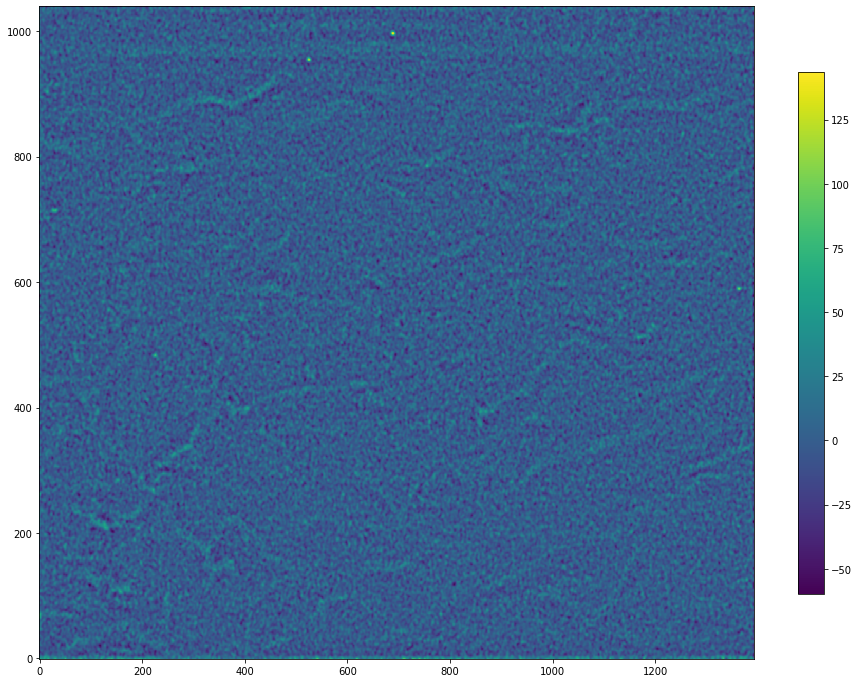

In [111]:
sigma_1 = 2
sigma_2 = 5

image_lowpass = gf(image, sigma=sigma_2)
image_ptsrc = gf(image, sigma=sigma_1) 

Imshow(image_lowpass)
Imshow(image_ptsrc - image_lowpass)

A little thresholding makes the star candidates more obvious

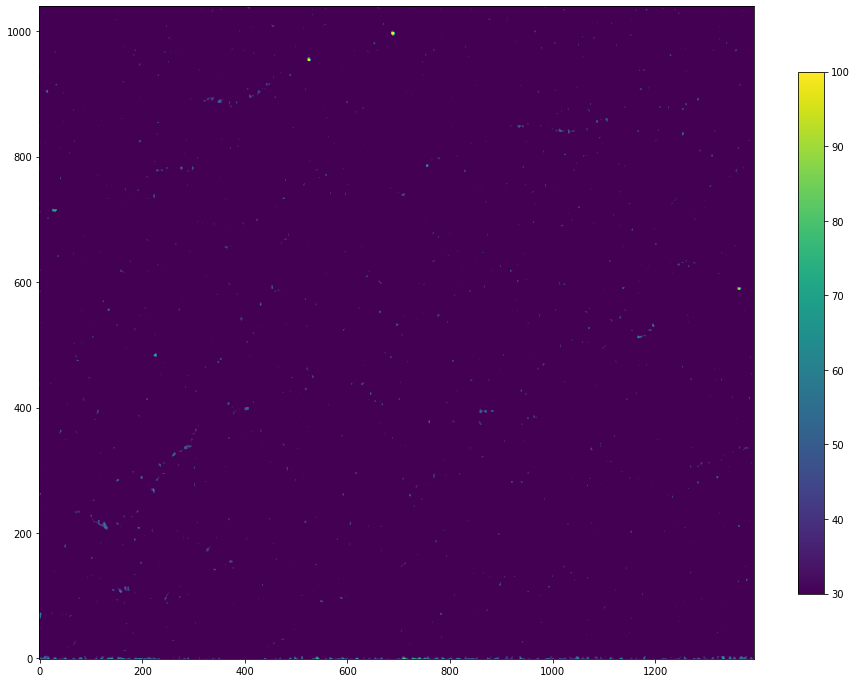

In [112]:
Imshow(image_ptsrc - image_lowpass, vmin=30, vmax=100)

Let's do a little source finding.

In [113]:
image_srcfind = image_ptsrc - image_lowpass

In [114]:
# We need to specify the size of the star in the image for best results. 
# Since we set a smoothing of sigma_1, we should pick 2.35 * sigma_1
fwhm = 2.35 * sigma_1
sources, apertures = FindSources(image_srcfind, fwhm = fwhm, threshold_sigma=4)
sources

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64
1,1362.286700061744,589.3240463467638,0.3555153765016202,-0.11723804849090633,-0.7368477575658062,25,0.0,100.0031800476238,1.4473197595315093,-0.40141122838248605
2,525.0219150305976,954.1738168567108,0.34812195853626465,-0.16634985021556764,-0.6013989687553435,25,0.0,118.36603084951784,1.663893661749317,-0.5528139184817322
3,688.7617628756225,995.9807763792255,0.3589005234380597,-0.1267208265550587,-0.5853530541934943,25,0.0,143.7097095034672,1.9883141255723782,-0.7462124947026406


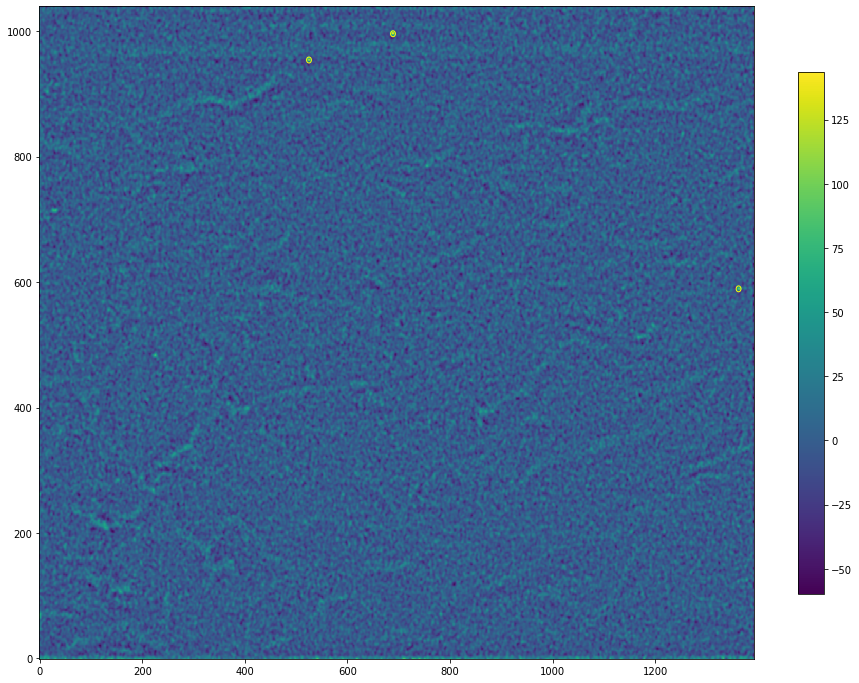

In [115]:
Imshow(image_srcfind)
apertures.plot(color='yellow')

A question naturally arises about the optimal choice of $\sigma_1$ and $\sigma_2$. 

In [116]:
# Generate images with a range of Gaussian blurring
nblur = 10
gaussblur = np.zeros([image.shape[0], image.shape[1], nblur])
for i in np.arange(nblur):
    gaussblur[:,:,i] = gf(image, sigma=i)

In [117]:
# Create all the possible differences where sigma_2 > sigma_1
diffs = np.zeros([image.shape[0], image.shape[1], nblur, nblur])
for i in np.arange(nblur):
    for j in np.arange(i+1,nblur):
        diffs[:,:,i,j] = gaussblur[:,:,i] - gaussblur[:,:,j]

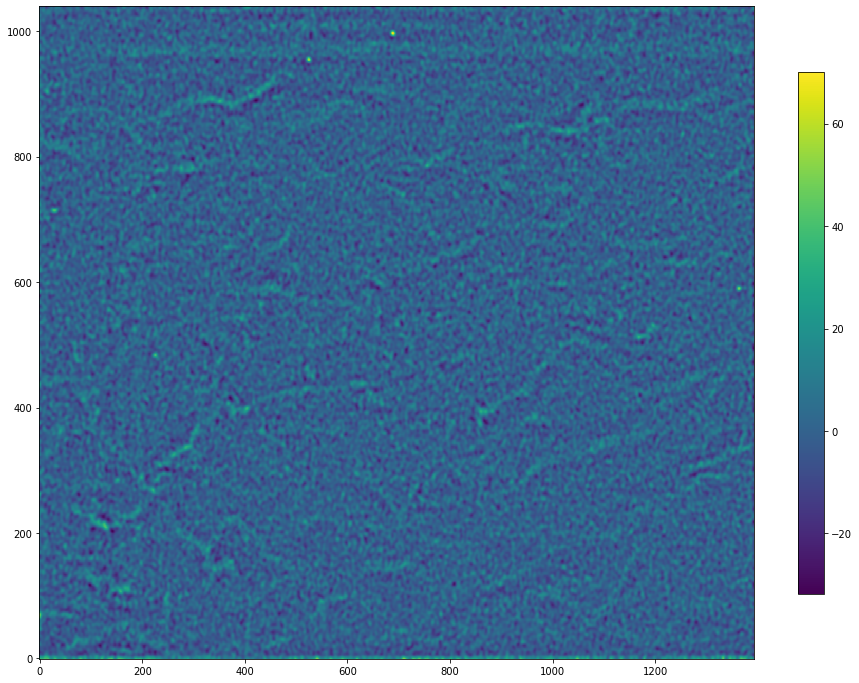

In [118]:
Imshow(diffs[:,:,3,5])

Another possibility is to use a Wiener filter.  This relies on filtering in Fourier space.  We'll need to define the k vector for later use.

In [119]:
# Note the use of fftfreq, and the ordering of the number of pixels along x and y
# This seems to correspond with the way the display is labeled in imshow
ny, nx = image.shape
kx = np.outer(np.ones(ny), np.fft.fftfreq(nx))
ky = np.outer(np.fft.fftfreq(ny), np.ones(nx))
k = np.power(kx**2 + ky**2, 0.5)
kextent = [kx.min(),kx.max(),ky.min(),ky.max()]

In [120]:
pimage = psd2d(image)
tmp = pimage.copy()
tmp[ky == 0] = 1e9
tmp[kx == 0] = 1e9
mfpimage = scimg.median_filter(tmp, [7,7])

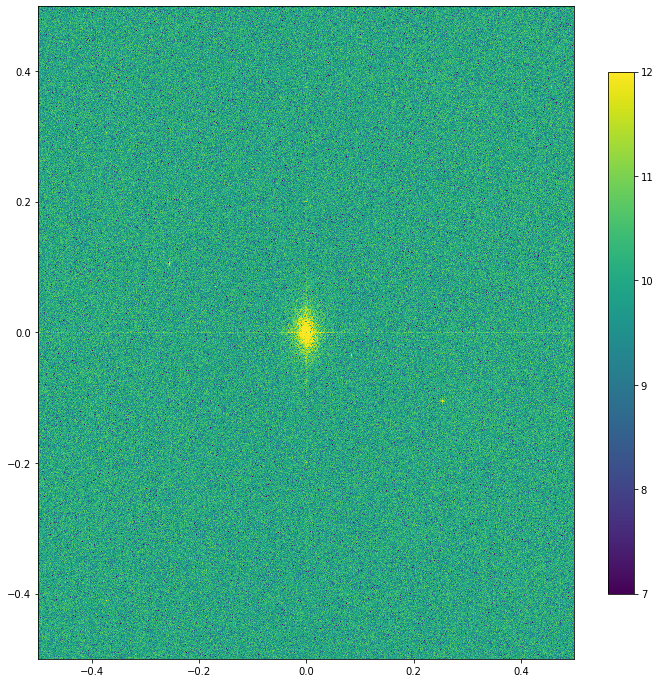

In [138]:
# There are two localized spikes at high-k - not sure what they are.  
# The horizontal/vertical "crosshair" are the horizontal / vertical stripes in the image
# The central stuff is the low-k fluffy clouds
Imshow(np.fft.fftshift(np.log10(pimage)), extent=kextent, figsize=(12,12), vmin=7, vmax=12)

In [139]:
# Let's build a filter that suppresses the horizontal and vertical streaks
xyfilt = np.ones_like(image)
xyfilt[ky == 0] = 0
xyfilt[kx == 0] = 0

C:\Users\16472\anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log10
  """Entry point for launching an IPython kernel.


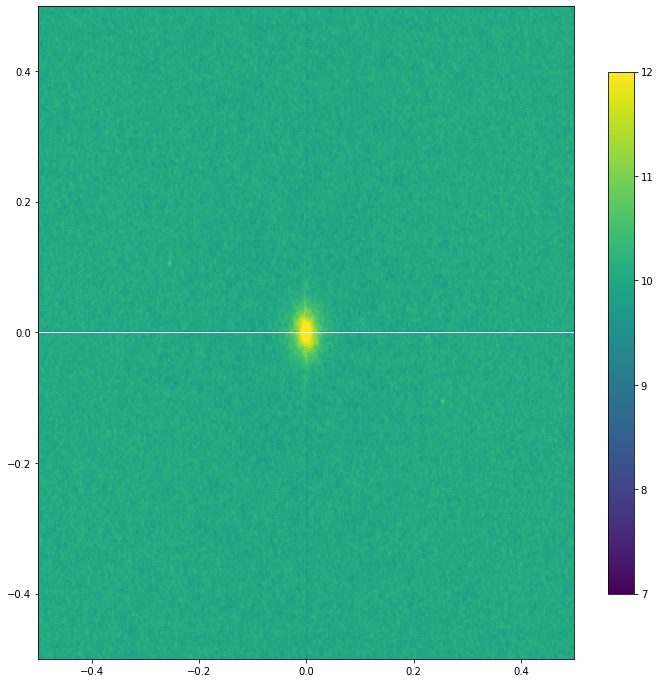

In [148]:
Imshow(np.fft.fftshift(np.log10(mfpimage*xyfilt)), 
       extent=kextent, figsize=(12,12), vmin=7, vmax=12)

In [141]:
Imshow(np.fft.fftshift(np.log10(pimage/mfpimage*xyfilt)), 
       extent=kextent, figsize=(7,7))a

SyntaxError: invalid syntax (<ipython-input-141-aaa84ce0e79f>, line 2)

In [142]:
kbins = np.logspace(np.log10(k[k>0].min()),np.log10(k.max()))

In [143]:
psd1d, psd1d_be, psd1d_indx = binned_statistic(k.flatten(), (pimage*xyfilt).flatten(), bins=kbins)

In [144]:
def pwrlaw(k, A = 2.0e12, k0 = 0.01, alpha=2.5):
    return A*np.power(k/k0, -alpha) 
white = 1.5e10

In [145]:
psd1d

array([           nan,            nan, 0.00000000e+00, 1.00134711e+14,
       0.00000000e+00,            nan, 8.38165801e+13, 4.45874590e+13,
       1.96423558e+13, 9.40502393e+12, 1.87425743e+13, 1.95268167e+13,
       1.33848958e+13, 7.33006738e+12, 9.49737413e+12, 4.75414892e+12,
       4.98756061e+12, 4.10192221e+12, 2.61098128e+12, 1.80091126e+12,
       1.18604470e+12, 6.93399442e+11, 5.30664677e+11, 3.69564909e+11,
       2.01959445e+11, 1.18927888e+11, 8.22508261e+10, 5.37544848e+10,
       3.61210885e+10, 2.72052495e+10, 2.04892287e+10, 1.75231338e+10,
       1.60501700e+10, 1.45779215e+10, 1.48162662e+10, 1.46073169e+10,
       1.42003341e+10, 1.40423963e+10, 1.41347841e+10, 1.45140088e+10,
       1.45790200e+10, 1.49404397e+10, 1.54511566e+10, 1.52211334e+10,
       1.54021398e+10, 1.54102131e+10, 1.54544828e+10, 1.54698284e+10,
       1.54710275e+10])

<Figure size 432x288 with 0 Axes>

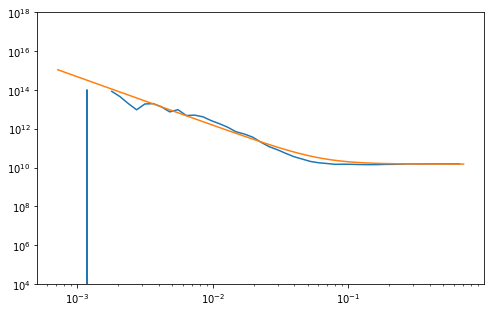

In [146]:
plt.clf()
plt.figure(figsize=(8,5))
#plt.loglog(k.flatten(),pimage.flatten(),'.', label='all')
#plt.loglog(k.flatten(),(pimage*xyfilt).flatten(),'.', label='xyfilt')
plt.loglog(BinCenter(psd1d_be),psd1d)
plt.plot(kbins, pwrlaw(kbins, A=1.5e12) + white)
plt.ylim([1e4,1e18])
plt.show()

In [147]:
wfilt = white/(pwrlaw(k) + white) * xyfilt
#wfilt = 1.5e10/np.sqrt(mfpimage)*xyfilt
wfilt[k==0] = 0

C:\Users\16472\anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in power
  


In [131]:
# Moment of truth
wfimage = np.fft.ifft2(np.fft.fft2(image)*wfilt).real

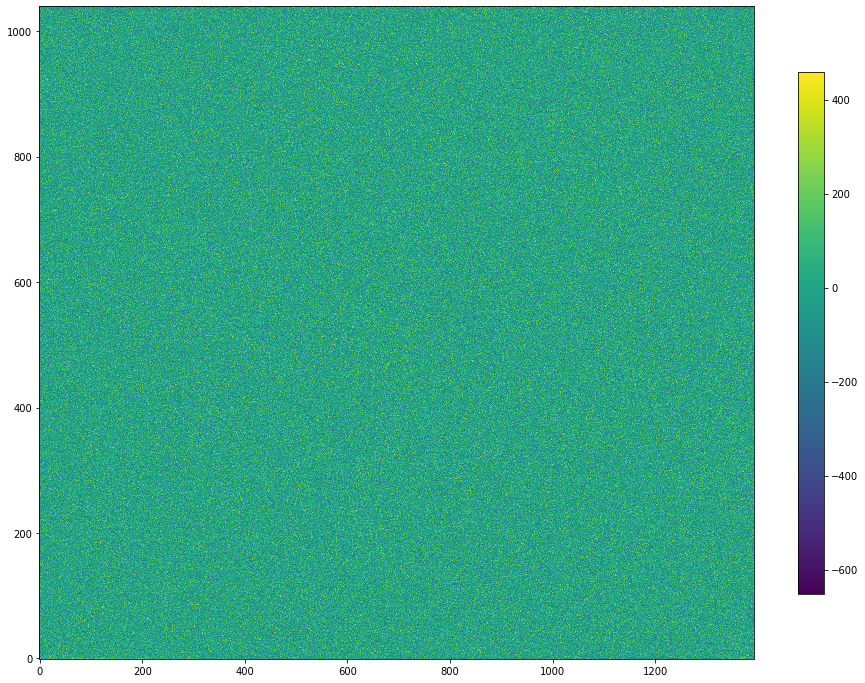

In [132]:
# After Wiener filtering, the result is pretty much white noise ...
Imshow(wfimage)

In [133]:
swfimage = gf(wfimage, sigma=3)

In [134]:
sources_wf, apertures_wf = FindSources(swfimage, fwhm = fwhm, threshold_sigma=2.8)
sources_wf

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64
1,1153.7776726301136,64.7303166861174,0.354421281876401,0.030035075078520653,0.35292619464182545,25,0.0,9.809779056978421,1.049448870603487,-0.05240321126059909
2,225.90311963141266,483.3849843034093,0.345257580174145,0.06747119185361573,-0.20842937284972998,25,0.0,23.239539346398587,1.2189129168833226,-0.21493169827895367
3,1362.1687899406006,589.5153805535065,0.34492594177607694,-0.0473434103940693,-0.4740275111718839,25,0.0,29.9804634738546,1.7120054071225672,-0.5837628299997192
4,755.2990355689411,785.4066421319851,0.345440750564053,0.052326051188606,-0.37204370534096703,25,0.0,18.095517804341462,1.1017791648720714,-0.1052363885388797
5,1252.6550455880579,835.7168645488093,0.34464199295610465,0.24735547299039184,0.5921758347369763,25,0.0,16.176633826754482,1.0468509408814999,-0.04971211928495333
6,524.9628100173593,954.1376086118202,0.3443892463033427,-0.10893187150324625,-0.35242322752272676,25,0.0,37.429062389270584,2.107817318272578,-0.8095824211139507
7,688.7523511707728,996.0760386058923,0.3455402983786988,-0.0864457338687912,-0.39381257387160773,25,0.0,42.522476221218625,2.372120459925267,-0.9378418484848745


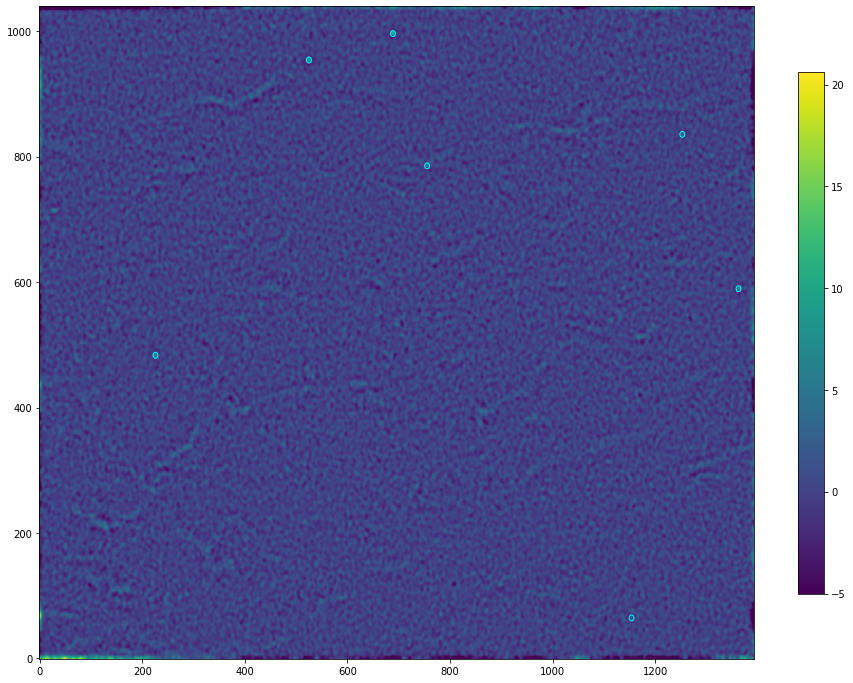

In [135]:
# If we smooth that image, the residual of the clouds is pretty clear.  That structure is not what you'd expect
# from a Gaussian random field
Imshow(swfimage/mad_std(swfimage), vmin = -5)#, vmax=10)
apertures_wf.plot(color='cyan')

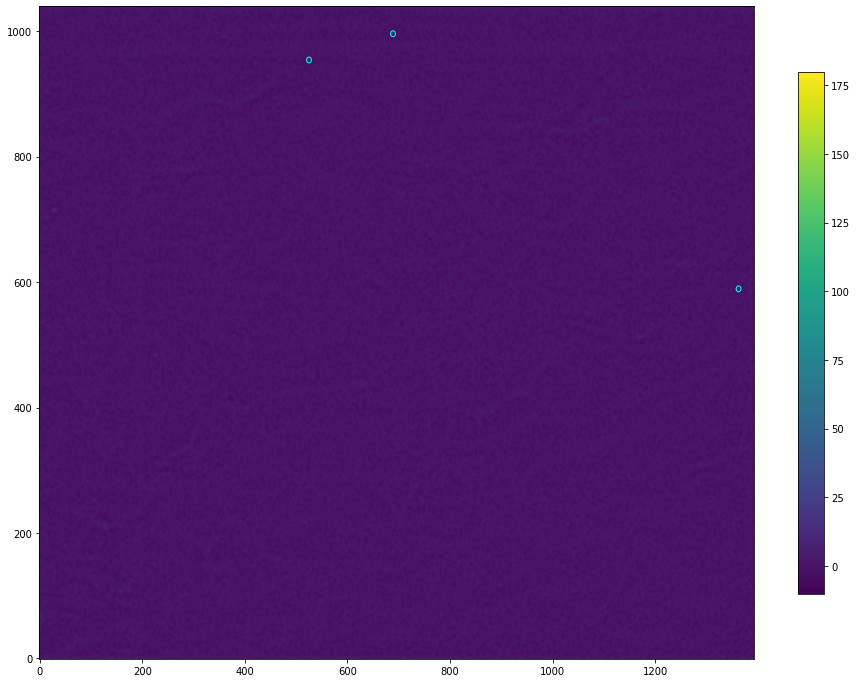

In [136]:
Imshow(image_srcfind/mad_std(image_srcfind), vmin=-10, vmax=180)
apertures.plot(color='cyan')